# SquiggleDraw - Vectorizing Bitmap Images with Squiggles

I recently got my hands on a new toy: the [Axidraw V3](https://www.youtube.com/watch?v=5492ZjivAQ0&ab_channel=EvilMadScientist). A type of *pen plotter*, this machine uses two dimensions of motorized movement to draw whatever it's instructed to. It can be controlled in a number of ways, but usually you pass the digital drawing instructions as an [SVG file](https://developer.mozilla.org/en-US/docs/Learn/HTML/Multimedia_and_embedding/Adding_vector_graphics_to_the_Web), which is a common format for [vector graphics](https://en.wikipedia.org/wiki/Vector_graphics) used on the web. 

There are many ways to create art with the pen plotter. One of the most common methods is drawing vectorized bitmap images. This means taking an image with pixel representation- like one taken with a camera- and translating it to a vector representation. Just as there can be inumerable ways to sketch the same picture of a beatuiful beach sunset, there are [many ways to vectorize bitmap images](https://drawingbotv3.readthedocs.io/en/latest/pfms.html).

I recently implemented one such way to vectorize bitmap images in python, called SquiggleDraw, inspired by a [previous implementation](https://github.com/gwygonik/SquiggleDraw) in a language called [Processing](https://processing.org/). SquiggleDraw turns a bitmap image into many horizontal sinusoidal waves whose amplitude and frequency depend on the images luminance.   

In [1]:
from squiggledraw import SquiggleDrawer

## First Example

This is a picture of my dog, [gus](http://jwalk.io/gus), sleeping.

<img src="gus.jpg" alt="Drawing" style="width: 400px;"/>

We can use the SquiggleDrawer object to prepare the image before we convert it to vector graphics. Usually, it helps to increase the contrast and downsample the image, as each row of pixels will be turned into a single drawn line, and you don't want *too many* lines.  

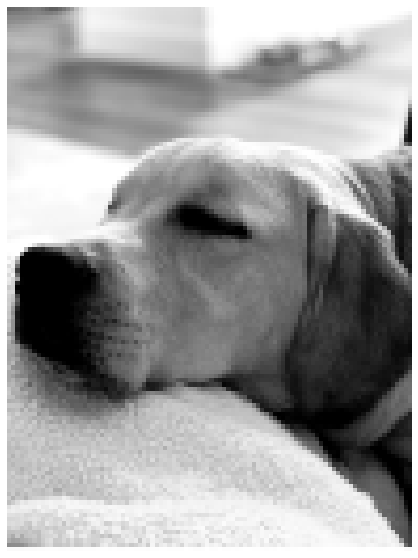

In [2]:
squiggle_drawer = SquiggleDrawer()
squiggle_drawer.prep_image(fname='gus.jpg', contrast_cutoff=4, downsample_amount=16)
squiggle_drawer.show_image()

Now we can calculcate and render the *squiggles*. The paramters change how to squiggles are generated, and are described in the docstring.

In [3]:
squiggle_drawer.calculate_squiggles(
                    max_wave_num = 5,
                    wave_num_threshold = 1.2,
                    max_amplitude= 2,
                    amp_threshold = 1,
                    resolution = 20,
                    )

squiggle_drawer.render_squiggles( 
                width_in_inches = 8.5,
                height_in_inches = 11,
                border_in_inches = .5,
                line_width = .2,
                rgb=(0, 0, 0),
                )

This is what the resulting squiggles look like.

In [4]:
import IPython
IPython.display.SVG(data=squiggle_drawer.svgio.getvalue())

## Another Example

<img src="fourier.jpg" alt="Drawing" style="width: 400px;"/>

In [5]:
squiggle_drawer = SquiggleDrawer()

squiggle_drawer.prep_image(fname='fourier.jpg', contrast_cutoff=10, downsample_amount=10)

squiggle_drawer.calculate_squiggles(
                    max_wave_num = 5,
                    wave_num_threshold = 3,
                    max_amplitude= 2.5,
                    amp_threshold = 1,
                    resolution = 20,
                    )

squiggle_drawer.render_squiggles( 
                width_in_inches = 8.5,
                height_in_inches = 11,
                border_in_inches = .5,
                line_width = .2,
                rgb=(0, 0, 0),
                )        

IPython.display.SVG(data=squiggle_drawer.svgio.getvalue())


In [6]:
squiggle_drawer.save_squiggle_image(fname='fourier_squiggled.svg')

### Optimizing

I recomend you use an SVG optimizer like [scour](https://github.com/scour-project/scour) if you are going to use the files in a web application. This will reduce the file size and improve the rendering of the vector graphics.

In [7]:
! scour -i fourier_squiggled.svg -o fourier_squiggled_optimized.svg

Scour processed file "fourier_squiggled.svg" in 4446 ms: 3842833/5940874 bytes new/orig -> 64.7%


### Pen Plotting

Heres that image after drawn with the pen plotter

<img src="fourier_drawn.jpg" alt="Drawing" style="width: 600px;"/>